PEDESTRIAN SEMANTIC SEGMENTATION MODEL 

In [98]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pytorch_lightning as pl
from torch.utils.data import DataLoader
from torch.utils.data import ConcatDataset
from torch.utils.data import Dataset as BaseDataset
import albumentations as albu
import torch
import numpy as np
import segmentation_models_pytorch as smp
from PIL import Image

In [99]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [100]:
# load up the CamVid Dataset
DATA_DIR = ".\\data\\CamVid"

# load repo with data if it is not exists
if not os.path.exists(DATA_DIR):
    print('Loading data...')
    os.system('git clone https://github.com/alexgkendall/SegNet-Tutorial ./data')
    print('Done!')
    
# defining paths
x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'trainannot')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'valannot')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'testannot')

In [101]:
# helper function for data visualization
def visualize(**images):
    n = len(images)
    plt.figure(figsize=(16,5))
    for i, (name, image) in enumerate (images.items()):
        plt.subplot(1, n, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

In [102]:
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['person']

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

# ------------ Create Augmentation ------------  
# Use augmentation to prevent overfitting
# training augmentation
def get_training_augmentation():
    train_transform = [
        # applies to all images
        albu.HorizontalFlip(p=0.5),
        albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),
        albu.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=1),
        albu.RandomCrop(height=320, width=320, always_apply=True),
        albu.GaussNoise(p=0.2),
        albu.Perspective(p=0.5),
        
        # selects one of the following
        albu.OneOf(
            [
                albu.CLAHE(p=1),
                albu.RandomBrightnessContrast(p=1),
                albu.RandomGamma(p=1)
            ],
            p=0.9
        ),
        
        albu.OneOf(
            [
                albu.Blur(blur_limit=3, p=1),
                albu.Sharpen(p=1),
                albu.MotionBlur(blur_limit=3, p=1)
            ],
            p=0.9
        )
    ]
    return albu.Compose(train_transform)

# validation augmentation -> add padding to make image shape divisible by 32
def get_validation_augmentation():
    test_transform = [
        albu.PadIfNeeded(384, 480)
    ]
    return albu.Compose(test_transform)

def add_training_crop():
    train_transform = [
        albu.RandomCrop(height=320, width=320, always_apply=True),
        # albu.Lambda(image=to_tensor, mask=to_tensor)
    ]
    return albu.Compose(train_transform)

In [103]:
# Adapted from dataset loader written by meetshah1995 with modifications
# https://github.com/meetshah1995/pytorch-semseg/blob/master/ptsemseg/loader/cityscapes_loader.py

def recursive_glob(rootdir=".", suffix=""):
    return [
        os.path.join(looproot, filename)
        for looproot, _, filenames in os.walk(rootdir)
        for filename in filenames
        if filename.endswith(suffix)
    ]


# Dataloader for cityscapes dataset
class cityscapesLoader(BaseDataset):
    colors = [  # [  0,   0,   0],
        [128, 64, 128],
        [244, 35, 232],
        [70, 70, 70],
        [102, 102, 156],
        [190, 153, 153],
        [153, 153, 153],
        [250, 170, 30],
        [220, 220, 0],
        [107, 142, 35],
        [152, 251, 152],
        [0, 130, 180],
        [220, 20, 60],
        [255, 0, 0],
        [0, 0, 142],
        [0, 0, 70],
        [0, 60, 100],
        [0, 80, 100],
        [0, 0, 230],
        [119, 11, 32],
    ]

    # makes a dictionary with key:value. For example 0:[128, 64, 128]
    label_colours = dict(zip(range(19), colors))

    # these are 19 + 1; "unlabelled" is extra
    CLASSES = [
        #"unlabelled",
        "road",
        "sidewalk",
        "building",
        "wall",
        "fence",
        "pole",
        "traffic_light",
        "traffic_sign",
        "vegetation",
        "terrain",
        "sky",
        "person",
        "rider",
        "car",
        "truck",
        "bus",
        "train",
        "motorcycle",
        "bicycle",
    ]
    def __init__(
        self,
        root,
        # which data split to use
        split="train",
        # transform function activation
        is_transform=True,
        # image_size to use in transform function
        img_size=(512, 1024), classes=None, augmentation=None, preprocessing=None
    ):
        self.root = root
        self.split = split
        self.is_transform = is_transform
        self.n_classes = 19
        self.img_size = img_size if isinstance(img_size, tuple) else (img_size, img_size)
        self.files = {}
        self.augmentation = augmentation
        self.preprocessing = preprocessing
        
    
        self.images_base = os.path.join(self.root, "leftImg8bit", self.split)
        self.annotations_base = os.path.join(self.root, "gtFine", self.split)
        
        # contains list of all pngs inside all different folders. Recursively iterates 
        self.files[split] = recursive_glob(rootdir=self.images_base, suffix=".png")

        self.void_classes = [0, 1, 2, 3, 4, 5, 6, 9, 10, 14, 15, 16, 18, 29, 30, -1]
        
        # these are 19
        self.valid_classes = [7, 8, 11, 12, 13, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33,
        ]
        

        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
        # for void_classes; useful for loss function
        self.ignore_index = 250
        
        # dictionary of valid classes 7:0, 8:1, 11:2
        self.class_map = dict(zip(self.valid_classes, range(19)))

        if not self.files[split]:
            raise Exception("No files for split=[%s] found in %s" % (split, self.images_base))
        
        # prints number of images found
        print("Found %d %s images" % (len(self.files[split]), split))

    def __len__(self):
        return len(self.files[self.split])

    def __getitem__(self, index):
        # path of image
        img_path = self.files[self.split][index].rstrip()
        
        # path of label
        lbl_path = os.path.join(
            self.annotations_base,
            img_path.split(os.sep)[-2],
            os.path.basename(img_path)[:-15] + "gtFine_labelIds.png",
        )

        # read image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # read label
        lbl = cv2.imread(lbl_path)
        
        # encode using encode_segmap function: 0...18 and 250
        lbl = self.encode_segmap(np.array(lbl, dtype=np.uint8))
        
        # coordinates where pedestrians are present
        person_coords = np.argwhere(lbl == self.class_values)
        
        # blank mask of same size as img
        mask = np.zeros_like(lbl)

        # putting ONLY the pedestrian segmentation on the blank mask
        for coord in person_coords:
            if 0 <= coord[0] < mask.shape[0] and 0 <= coord[1] < mask.shape[1]:
                mask[coord[0], coord[1]] = 255
        
        #convert from 0 to 255 to 0 and 1
        mask = mask / 255    
        # apply augmentation
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask'] 
        
        final_mask = np.mean(mask, axis=0, keepdims=True)
        return image, final_mask
      
    def decode_segmap(self, temp):
        r = temp.copy()
        g = temp.copy()
        b = temp.copy()
        for l in range(0, self.n_classes):
            r[temp == l] = self.label_colours[l][0]
            g[temp == l] = self.label_colours[l][1]
            b[temp == l] = self.label_colours[l][2]

        rgb = np.zeros((temp.shape[0], temp.shape[1], 3))
        rgb[:, :, 0] = r / 255.0
        rgb[:, :, 1] = g / 255.0
        rgb[:, :, 2] = b / 255.0
        return rgb

    # there are different class 0...33
    # we are converting that info to 0....18; and 250 for void classes
    # final mask has values 0...18 and 250
    def encode_segmap(self, mask):
        for _voidc in self.void_classes:
            mask[mask == _voidc] = self.ignore_index
        for _validc in self.valid_classes:
            mask[mask == _validc] = self.class_map[_validc]
        return mask

In [104]:
# CamVid dataloader  
class Dataset(BaseDataset):
    """CamVid Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 
            'tree', 'signsymbol', 'fence', 'car', 
            'pedestrian', 'bicyclist', 'unlabelled']
    
    def __init__( self, images_dir, masks_dir, classes=None, augmentation=None, preprocessing=None, transforms=None):
        self.ids = os.listdir(images_dir)
        self.images_fps = [ os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]
        
        # converting str names to class values on the masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
        self.transforms = transforms
        
    def __getitem__(self, i):
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], 0)
        
        # extract certain classes from mask (e.g. cars)
        masks = [(mask == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')
        
        # apply augmentation
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask'] 
            
        if self.transforms:
            sample = self.transforms(image=image, mask=mask)
            image, mask = sample['image'], sample['mask'] 
        
        print(type(image), type(mask))  
        return image, mask
    
    def __len__(self):
        return len(self.ids)

In [105]:
CLASSES_CAM = ['pedestrian'] #for camVid 
#define dataset
org_train_dataset = cityscapesLoader(root='.\\datasets\\citys', split='train', is_transform=True, classes=CLASSES, augmentation=add_training_crop(), preprocessing=get_preprocessing(preprocessing_fn))
org_train_camVid = Dataset(x_train_dir, y_train_dir, augmentation=add_training_crop(), preprocessing=get_preprocessing(preprocessing_fn), classes=CLASSES_CAM)

aug_train_dataset = cityscapesLoader(root='.\\datasets\\citys', split='train', is_transform=True, classes=CLASSES, augmentation=get_training_augmentation(), preprocessing=get_preprocessing(preprocessing_fn))
aug_train_camVid = aug_train_dataset = Dataset( x_train_dir, y_train_dir, augmentation=get_training_augmentation(), preprocessing=get_preprocessing(preprocessing_fn), classes=CLASSES_CAM)


validation_dataset = cityscapesLoader(root='.\\datasets\\citys', split='val', is_transform=True, classes=CLASSES, augmentation=get_validation_augmentation(), preprocessing=get_preprocessing(preprocessing_fn))
validation_camVid = Dataset( x_valid_dir, y_valid_dir, augmentation=get_validation_augmentation(), preprocessing=get_preprocessing(preprocessing_fn), classes=CLASSES_CAM)

train_dataset = ConcatDataset([org_train_dataset, aug_train_dataset, org_train_camVid, aug_train_camVid])
validation_dataset = ConcatDataset([validation_dataset, validation_camVid])

print(f'Train size: {len(train_dataset)}')
print(f'Valid size: {len(validation_dataset)}')

Found 539 train images
Found 539 train images
Found 441 val images
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
Train size: 1640
Valid size: 542


In [106]:
# define datalaoder
train_dl = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=0)
validation_dl = DataLoader(validation_dataset, batch_size=1, shuffle=True, num_workers=0)

Found 99 test images


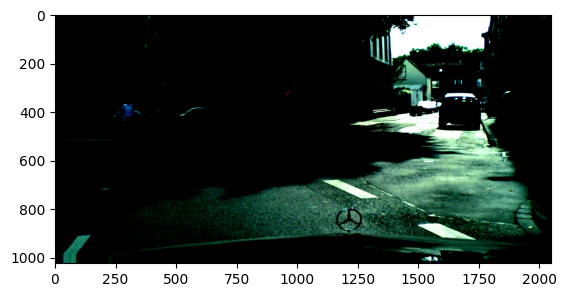

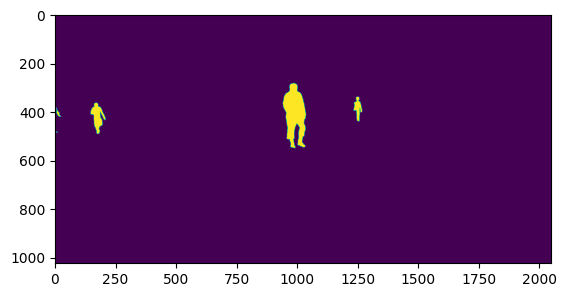

In [107]:
# define test dataset with cityscapes
test_dataset = cityscapesLoader(root='.\\datasets\\citys', split='test', is_transform=True, classes=['person'], augmentation=get_validation_augmentation(), preprocessing=get_preprocessing(preprocessing_fn))
test_dl = DataLoader(test_dataset, batch_size=1, shuffle=True)

LIGHTNING MODULE

In [108]:
class PedestiranModel(pl.LightningModule):
    def __init__(self, arch, encoder_name, in_channels, out_classes, **kwargs):
        super().__init__()
        self.model = smp.create_model(arch, encoder_name=encoder_name, in_channels=in_channels, classes=out_classes, **kwargs)

        #preprocessing parameter for image 
        params = smp.encoders.get_preprocessing_params(encoder_name) 
        self.register_buffer("std", torch.tensor(params["std"]).view(1,3,1,1))
        self.register_buffer("mean", torch.tensor(params["mean"]).view(1,3,1,1))
        
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)
        
    def forward(self, image):
        # normalize the image
        image = (image - self.mean) / self.std
        mask = self.model(image)
        return mask
    
    def shared_step(self, batch, stage):
        image, mask = batch
       
        # Shape of the image should be (batch_size, num_channels, height, width)
        # if you work with grayscale images, expand channels dim to have [batch_size, 1, height, width]
        assert image.ndim == 4
        h, w = image.shape[2:]
        
        assert h % 32 == 0 and w % 32 == 0
        
        assert mask.ndim == 4
        
        # Check that mask values in between 0 and 1, NOT 0 and 255 for binary segmentation
        assert mask.max() <= 1.0 and mask.min() >= 0
        
        logits_mask = self.forward(image)
        
        # Predict mask contians logits, and loss_fn param 'from_logits' is set to True
        loss = self.loss_fn(logits_mask, mask)
        
        # Compute metrics for some threshold
        # convert mask values to probablities, then apply thresholding
        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()
        
        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode='binary', threshold=0.5)
        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }
        
    def shared_epoch_end(self, outputs, stage):
        # aggregate step metics
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        # per image IoU means that we first calculate IoU score for each image 
        # and then compute mean over these scores
        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        
        # dataset IoU means that we aggregate intersection and union over whole dataset
        # and then compute IoU score. The difference between dataset_iou and per_image_iou scores
        # in this particular case will not be much, however for dataset 
        # with "empty" images (images without target class) a large gap could be observed. 
        # Empty images influence a lot on per_image_iou and much less on dataset_iou.
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        metrics = {
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }
        
        self.log_dict(metrics, prog_bar=True)

    def training_step(self, batch, batch_idx):
        return self.shared_step(batch, "train")            

    def training_epoch_end(self, outputs):
        return self.shared_epoch_end(outputs, "train")

    def validation_step(self, batch, batch_idx):
        return self.shared_step(batch, "valid")

    def validation_epoch_end(self, outputs):
        return self.shared_epoch_end(outputs, "valid")

    def test_step(self, batch, batch_idx):
        return self.shared_step(batch, "test")  

    def test_epoch_end(self, outputs):
        return self.shared_epoch_end(outputs, "test")

    def configure_optimizers(self):
        if self.current_epoch > 25:
            return torch.optim.Adam(self.parameters(), lr=1e-5)
        return torch.optim.Adam(self.parameters(), lr=0.0001)

In [109]:
from pytorch_lightning.callbacks import ModelCheckpoint

# Saving best ckpt based on highest val IoU
dataset_ckpt = ModelCheckpoint(
    monitor='valid_dataset_iou',
    dirpath='.\\best_model\\dataset_ckpt',
    filename="{epoch}-{valid_dataset_iou:.2f}",
    save_top_k=1,
    mode='max',
    auto_insert_metric_name=True   
)

In [110]:
trainer = pl.Trainer(callbacks=[dataset_ckpt], gpus=1, fast_dev_run=True)
model = PedestiranModel("unet", "resnet50", in_channels=3, out_classes=1)
trainer.fit(model, train_dataloaders=train_dl, val_dataloaders=validation_dl)

best_ckpt = dataset_ckpt.best_model_path

c:\Users\beacort\Documents\New_Mobility\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\accelerator_connector.py:446: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Running in `fast_dev_run` mode: will run the requested loop using 1 batch(es). Logging and checkpointing is suppressed.
c:\Users\beacort\Documents\New_Mobility\.venv\Lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:606: UserWarning: Checkpoint directory .\best_model\dataset_ckpt exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
c:\Users\beacort\Documents\New_Mobility\.venv\Lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:606: UserWarnin

Epoch 0:   0%|          | 0/2 [00:00<?, ?it/s] <class 'numpy.ndarray'> <class 'numpy.ndarray'>
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
Epoch 0: 100%|██████████| 2/2 [00:03<00:00,  1.81s/it, loss=0.995, v_num=, valid_per_image_iou=0.000384, valid_dataset_iou=0.000384, train_per_image_iou=0.00252, train_dataset_iou=0.0025]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 0: 100%|██████████| 2/2 [00:03<00:00,  1.81s/it, loss=0.995, v_num=, valid_per_image_iou=0.000384, valid_dataset_iou=0.000384, train_per_image_iou=0.00252, train_dataset_iou=0.0025]


''

In [73]:
# Load best model
model = PedestiranModel.load_from_checkpoint(best_ckpt, arch="UNET", encoder_name="resnet50", in_channels=3, out_classes=1)

In [75]:
from pprint import pprint

# run validation dataset
valid_metrics = trainer.validate(model, dataloaders=validation_dl, verbose=False)
pprint(valid_metrics)

Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]
[{'valid_dataset_iou': 0.8092986345291138,
  'valid_per_image_iou': 0.8092986345291138}]


In [76]:
# run test dataset
test_metrics = trainer.test(model, dataloaders=test_dl, verbose=False)
pprint(test_metrics)

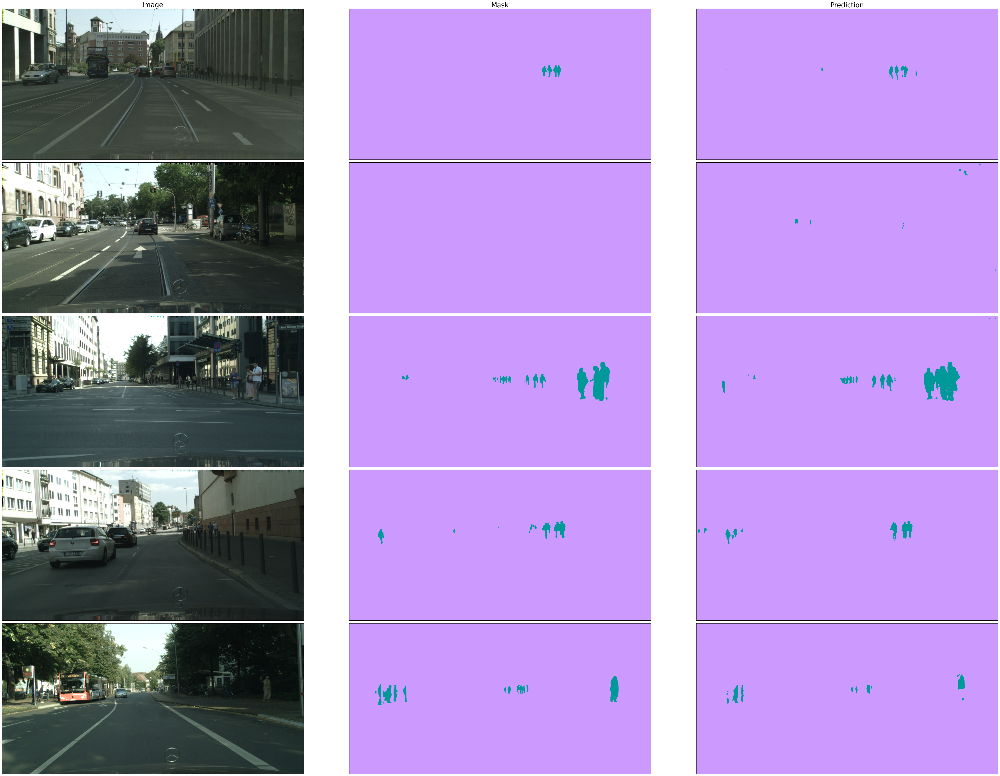

In [78]:
import random

# Visualizing the segmentation performances on random images
random.seed(430942) #134565 430942
samples = random.sample(range(len(test_dataset)), 5)

palette = [[204,153,255], [0,153,153]]
pal = [value for color in palette for value in color]

cols = ['Image', 'Mask', 'Prediction']
fig, axes = plt.subplots(len(samples), 3, figsize=(60, 40), sharex='row', sharey='row', 
                         subplot_kw={'xticks':[], 'yticks':[]}, tight_layout=True)

for ax, col in zip(axes[0], cols): ax.set_title(col, fontsize=25) # set column label --> considered epoch

i=0
    
for i in range(len(samples)):
        image, mask = (test_dataset[samples[i]])
        image = np.array(image).transpose(2, 0, 1)
        mask = np.array(mask).transpose(2, 0, 1)
        gray_mask = np.mean(mask, axis=0, keepdims=True)

        pred = model(torch.tensor(image)).unsqueeze(0)
        pred = (pred.sigmoid() > 0.5).long().squeeze(0)  
        pred = pred.squeeze(1)
        
        gray_mask = Image.fromarray(gray_mask.squeeze(0)).convert('P')
        pred = Image.fromarray(np.array(pred.squeeze(0).cpu()).astype('uint8')).convert('P')
        
        gray_mask.putpalette(pal)
        pred.putpalette(pal)

        axes[i, 0].imshow(np.array(image).transpose(1, 2, 0));
        axes[i, 1].imshow(gray_mask);
        axes[i, 2].imshow(pred);
        
        # saving PIL image
        gray_mask.save(f".\\results\\gt\\mask{i}.png")
        pred.save(f".\\results\\pred\\pred{i}.png")


In [79]:
from sklearn.metrics import recall_score, accuracy_score, precision_score, f1_score, jaccard_score

# Evaluation metrics for the images predicted above
for i in range(5):
    gt = Image.open(f".\\results\\gt\\mask{i}.png")
    pred = Image.open(f".\\results\\pred\\pred{i}.png")

    gt_array = np.array(gt)
    pred_array = np.array(pred)
    
    print(f'{i+1}:------------------------------------')
    recall = recall_score(y_true=gt_array, y_pred=pred_array, average='weighted', zero_division=0)
    print(f'Recall: {recall:.4f}')
    
    acc = accuracy_score(y_true=gt_array, y_pred=pred_array)
    print(f'Accuracy: {acc:.4f}')
    
    precision = precision_score(y_true=gt_array, y_pred=pred_array, average='weighted', zero_division=0)
    print(f'Precision: {precision:.4f}')
    
    f1 = f1_score(y_true=gt_array, y_pred=pred_array, average='weighted', zero_division=0)
    print(f'F1 Score: {f1:.4f}')
    
    jaccard = jaccard_score(y_true=gt_array, y_pred=pred_array, average='weighted', zero_division=0)
    print(f'Iou Score: {jaccard:.4f}')

1:------------------------------------
Recall: 0.7565
Accuracy: 0.8965
Precision: 0.8413
F1 Score: 0.7670
Iou Score: 0.6605
2:------------------------------------
Recall: 0.0000
Accuracy: 0.8525
Precision: 0.0000
F1 Score: 0.0000
Iou Score: 0.0000
3:------------------------------------
Recall: 0.9259
Accuracy: 0.7314
Precision: 0.8710
F1 Score: 0.8822
Iou Score: 0.8255
4:------------------------------------
Recall: 0.7504
Accuracy: 0.8477
Precision: 0.7900
F1 Score: 0.7479
Iou Score: 0.6712
5:------------------------------------
Recall: 0.4609
Accuracy: 0.7969
Precision: 0.7335
F1 Score: 0.5373
Iou Score: 0.4437
